In [31]:
# import the required packages
import pandas as pd
import numpy as np
import re

# visuals
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="white")
import matplotlib.dates as mdates
from datetime import datetime

import nltk
from collections import Counter
from sklearn.preprocessing import StandardScaler, PolynomialFeatures, MinMaxScaler

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn import tree
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

from feature_engine.outliers import Winsorizer
from feature_engine.imputation import RandomSampleImputer

## Data Preprocessing before Model Dev.

In [32]:
# data loading
df = pd.read_excel('final data/estate_soe_combined_api.xlsx')

In [33]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36683 entries, 0 to 36682
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Date            36683 non-null  datetime64[ns]
 1   Block           36683 non-null  object        
 2   IRR Value W/m²  36683 non-null  float64       
 3   Energy kWh      36683 non-null  float64       
 4   PR %            36683 non-null  float64       
 5   Sensor ID       18861 non-null  object        
 6   Sensor Type     36683 non-null  object        
 7   Month           36683 non-null  int64         
 8   Day             36683 non-null  int64         
 9   humidity(%)     36683 non-null  float64       
 10  air temp        36683 non-null  float64       
 11  rain fall       36683 non-null  float64       
dtypes: datetime64[ns](1), float64(6), int64(2), object(3)
memory usage: 3.4+ MB


In [34]:
df = df[df['Sensor Type'] == 'DPM']
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19079 entries, 0 to 36682
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Date            19079 non-null  datetime64[ns]
 1   Block           19079 non-null  object        
 2   IRR Value W/m²  19079 non-null  float64       
 3   Energy kWh      19079 non-null  float64       
 4   PR %            19079 non-null  float64       
 5   Sensor ID       18861 non-null  object        
 6   Sensor Type     19079 non-null  object        
 7   Month           19079 non-null  int64         
 8   Day             19079 non-null  int64         
 9   humidity(%)     19079 non-null  float64       
 10  air temp        19079 non-null  float64       
 11  rain fall       19079 non-null  float64       
dtypes: datetime64[ns](1), float64(6), int64(2), object(3)
memory usage: 1.9+ MB


In [35]:
df.head()

,Date,Block,IRR Value W/m²,Energy kWh,PR %,Sensor ID,Sensor Type,Month,Day,humidity(%),air temp,rain fall
0,2021-01-01,72,1154.274,41.210,80.00,DPM-599489-01,DPM,1,1,89.582452,24.670825,0.058947
1,2021-01-02,72,1154.274,26.352,80.00,DPM-599489-01,DPM,1,2,98.324167,28.606154,0.000000
2,2021-01-03,72,1154.274,67.860,80.00,DPM-599489-01,DPM,1,3,60.878473,28.379386,0.000000
3,2021-01-04,72,2440.595,126.320,80.03,DPM-599489-01,DPM,1,4,69.230882,26.554960,0.000000
4,2021-01-05,72,4479.086,235.240,81.21,DPM-599489-01,DPM,1,5,88.670588,26.203431,0.000000


#### setting index to date for forecasting

In [36]:
df.set_index('Date', inplace=True)
df.sort_index(inplace=True)

#### dropping redundant data

In [37]:
df.drop(['Sensor Type','Month','Day'], axis=1, inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 19079 entries, 2021-01-01 to 2024-05-05
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Block           19079 non-null  object 
 1   IRR Value W/m²  19079 non-null  float64
 2   Energy kWh      19079 non-null  float64
 3   PR %            19079 non-null  float64
 4   Sensor ID       18861 non-null  object 
 5   humidity(%)     19079 non-null  float64
 6   air temp        19079 non-null  float64
 7   rain fall       19079 non-null  float64
dtypes: float64(6), object(2)
memory usage: 1.3+ MB


In [38]:
print((df['IRR Value W/m²']==0).sum())
print((df['PR %']==0).sum())

218
218


In [39]:
### values of 0 are from SOE panels
df.drop(['IRR Value W/m²', 'PR %'], axis=1, inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 19079 entries, 2021-01-01 to 2024-05-05
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Block        19079 non-null  object 
 1   Energy kWh   19079 non-null  float64
 2   Sensor ID    18861 non-null  object 
 3   humidity(%)  19079 non-null  float64
 4   air temp     19079 non-null  float64
 5   rain fall    19079 non-null  float64
dtypes: float64(4), object(2)
memory usage: 1.0+ MB


In [40]:
df['Sensor ID'].fillna('SOE',inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 19079 entries, 2021-01-01 to 2024-05-05
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Block        19079 non-null  object 
 1   Energy kWh   19079 non-null  float64
 2   Sensor ID    19079 non-null  object 
 3   humidity(%)  19079 non-null  float64
 4   air temp     19079 non-null  float64
 5   rain fall    19079 non-null  float64
dtypes: float64(4), object(2)
memory usage: 1.0+ MB


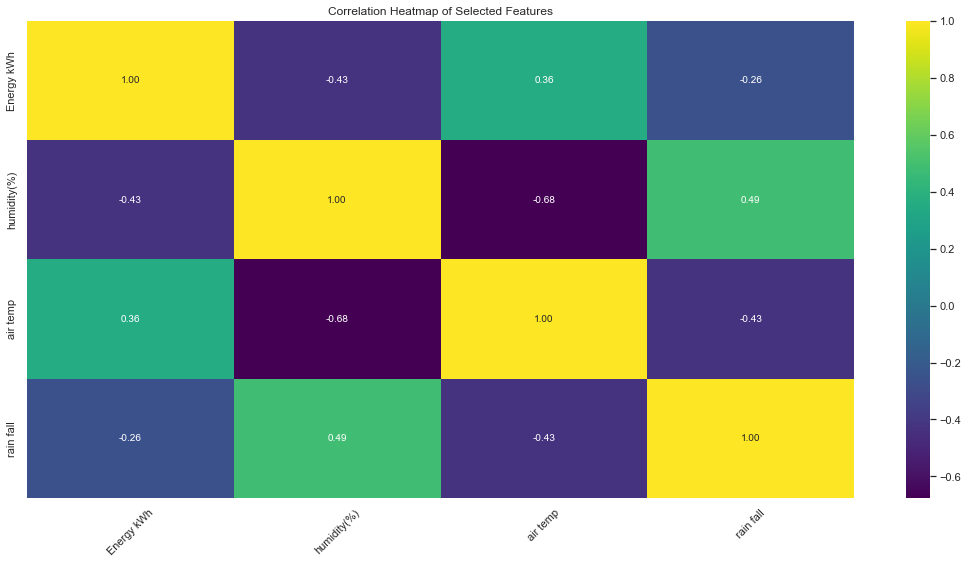

In [41]:
# corr matrix calculation
correlation_matrix = df.corr()

# plot heatmap
plt.figure(figsize=(15, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='viridis', fmt='.2f', annot_kws={'size': 10})
plt.title('Correlation Heatmap of Selected Features')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [42]:
import plotly.express as px
fig = px.scatter(df, x='air temp',y='Energy kWh',title='Energy kWh vs Air Temp', trendline='ols', trendline_color_override='red')
fig.show()

In [43]:
fig = px.scatter(df, x='rain fall',y='humidity(%)',title='Rain Fall vs Relative Humidity', trendline='ols', trendline_color_override='red')
fig.show()

In [44]:
fig = px.scatter(df, x='humidity(%)',y='Energy kWh',title='Relative Humidity vs Energy kWh', trendline='ols', trendline_color_override='red')
fig.show()

In [45]:
fig = px.scatter(df, x='rain fall',y='Energy kWh',title='Rain Fall vs Energy kWh', trendline='ols', trendline_color_override='red')
fig.show()

## Observing Seasonality

In [46]:
df_s = df.copy()
df_s.drop(['Sensor ID','Block'], axis=1, inplace=True)
df_s = df_s.groupby(df_s.index).mean()

duplicate_dates = df_s.index.duplicated(keep=False)
if not duplicate_dates.any():
    print("All dates are unique after aggregation.")
else:
    print("There are still duplicate dates in the data.")

All dates are unique after aggregation.


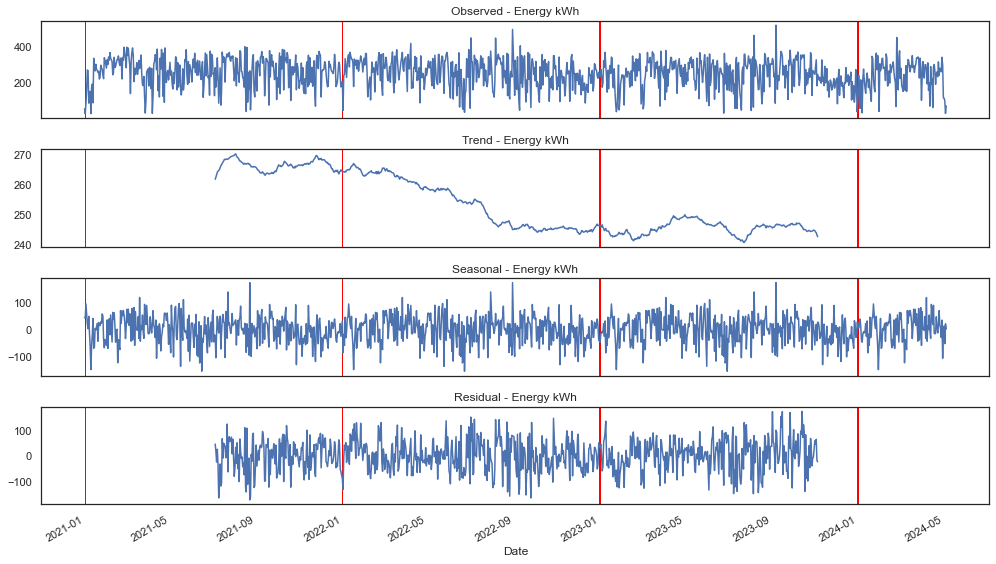

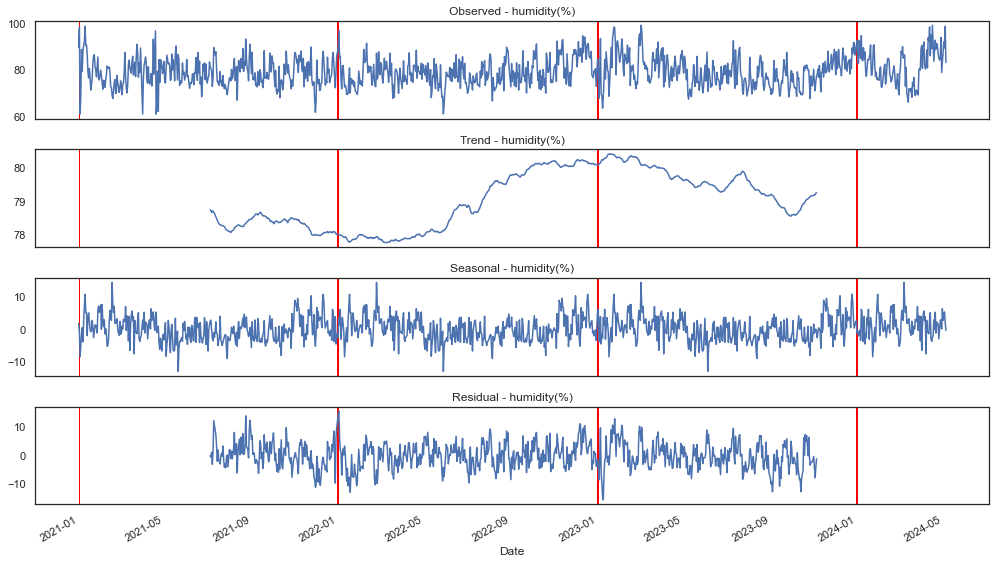

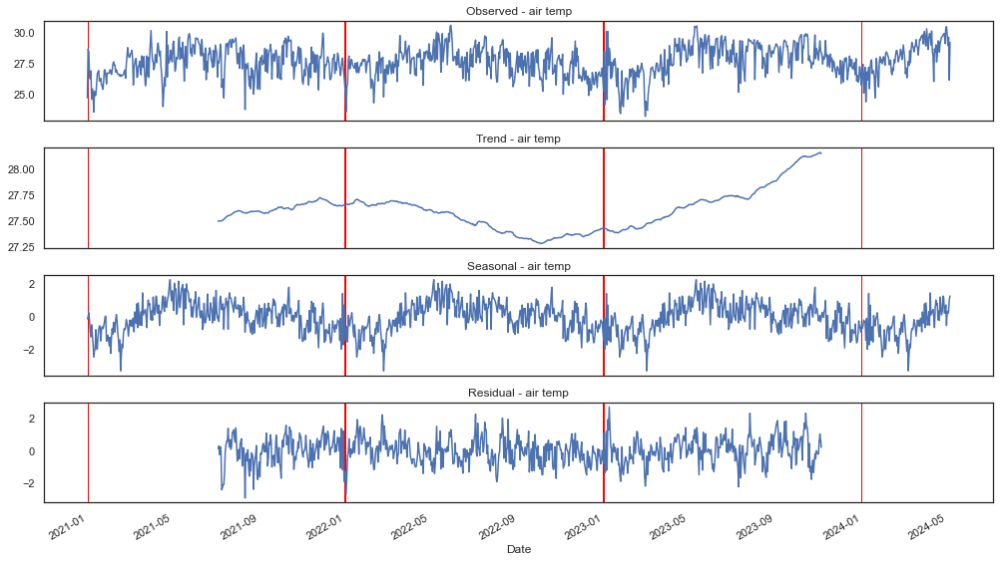

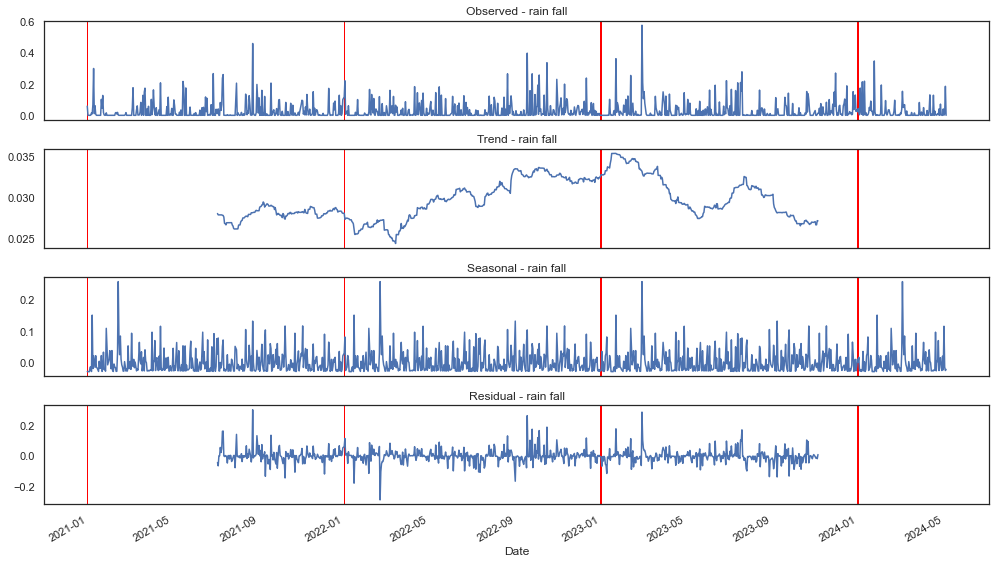

In [47]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from statsmodels.tsa.seasonal import seasonal_decompose
variables=['Energy kWh', 'humidity(%)', 'air temp', 'rain fall']

for var in variables:
    result = seasonal_decompose(df_s[var], model='additive', period=365)  # Adjust the period accordingly

    # decomposition plot
    fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(14, 8), sharex=True)
    result.observed.plot(ax=ax1, title=f'Observed - {var}')
    result.trend.plot(ax=ax2, title=f'Trend - {var}')
    result.seasonal.plot(ax=ax3, title=f'Seasonal - {var}')
    result.resid.plot(ax=ax4, title=f'Residual - {var}')
    start_year = df_s.index.min().year
    end_year = df_s.index.max().year

    for year in range(start_year, end_year + 1):
        for ax in [ax1, ax2, ax3, ax4]:
            rect = Rectangle((pd.Timestamp(f'{year}-01-01'), ax.get_ylim()[0]),
                   pd.Timestamp(f'{year}-12-31') - pd.Timestamp(f'{year}-01-01'),
                   ax.get_ylim()[1] - ax.get_ylim()[0], linewidth=1, edgecolor='red', facecolor='none')
            ax.add_patch(rect)

    plt.tight_layout()
    plt.show()

### Performing Stationery Test

In [48]:
# Stationery Test will be performed using ADF(Augmented Dickey-Fuller) Test

# Interpretation of results:
# ADF Stats: this value should be compared against the critical values. If ADF stats is less than the crit value, the null hypothesis of a unit root
#            can be rejected, indicating the series is stationery
# p-value: if the p-value is less than 0.05, the null hypothesis can be rejected, suggesting that the series is stationery
# critical values: provides thresholds for the test statistics at diff. significance levels (1%, 5% & 10%)

In [49]:
result = seasonal_decompose(df_s['Energy kWh'], model='additive', period=365)
from statsmodels.tsa.stattools import adfuller
residuals = result.resid.dropna()
adf_test = adfuller(residuals)
print('ADF Statistics: ', adf_test[0])
print('p-value: ', adf_test[1])
print('Critical Values: ')
for key,value in adf_test[4].items():
    print(f'  {key}: {value}')

ADF Statistics:  -11.388449905174626
p-value:  8.179472936652709e-21
Critical Values: 
  1%: -3.4382341228740345
  5%: -2.865020104308721
  10%: -2.568623096396542


In [50]:
result = seasonal_decompose(df_s['humidity(%)'], model='additive', period=365)
from statsmodels.tsa.stattools import adfuller
residuals = result.resid.dropna()
adf_test = adfuller(residuals)
print('ADF Statistics: ', adf_test[0])
print('p-value: ', adf_test[1])
print('Critical Values: ')
for key,value in adf_test[4].items():
    print(f'  {key}: {value}')

ADF Statistics:  -7.771829953027329
p-value:  8.87890793877069e-12
Critical Values: 
  1%: -3.4382819390603068
  5%: -2.865041182894659
  10%: -2.568634324805645


In [51]:
result = seasonal_decompose(df_s['air temp'], model='additive', period=365)
from statsmodels.tsa.stattools import adfuller
residuals = result.resid.dropna()
adf_test = adfuller(residuals)
print('ADF Statistics: ', adf_test[0])
print('p-value: ', adf_test[1])
print('Critical Values: ')
for key,value in adf_test[4].items():
    print(f'  {key}: {value}')

ADF Statistics:  -10.560487612145772
p-value:  7.75127823846032e-19
Critical Values: 
  1%: -3.43821515743291
  5%: -2.8650117437698652
  10%: -2.568618642812369


In [52]:
result = seasonal_decompose(df_s['rain fall'], model='additive', period=365)
from statsmodels.tsa.stattools import adfuller
residuals = result.resid.dropna()
adf_test = adfuller(residuals)
print('ADF Statistics: ', adf_test[0])
print('p-value: ', adf_test[1])
print('Critical Values: ')
for key,value in adf_test[4].items():
    print(f'  {key}: {value}')

ADF Statistics:  -11.890936967871498
p-value:  5.870976561855514e-22
Critical Values: 
  1%: -3.4382246287341967
  5%: -2.8650159190118694
  10%: -2.568620866925402


In [53]:
# - to reject null hypothesis that the residuals have a unit root, thus indicates that the residuals are stationary
# - the stationary status of the residuals implies that the non-stationery components of the original time series have been removed through the decomposition
#   process
# - since the residuals are stationary, it indicates TREND (effectively removed) & SEASONALITY (effectively isolated and removed)
# - thus, the stationary residuals suggest that the original time series did contain seasonal components

### Anomaly Detection Models - by Sensor ID

#### Isolation Forest Model

In [54]:
import hyperopt
import pickle
from hyperopt import fmin,tpe,hp,Trials
from sklearn.ensemble import IsolationForest
import plotly.express as px
import ipywidgets as widgets
from IPython.display import display, clear_output
df_f = df.copy()
sensor_ids = df_f['Sensor ID'].unique()

In [55]:
sensor_dropdown = widgets.Dropdown(
    options=sensor_ids,
    value=sensor_ids[0],  
    description='Sensor ID:',
    style={'description_width': 'initial'}
)

In [56]:
best_params_dict = {}

def optimize_sensor_type(sensor_id):

    df_sensor = df_f[df_f['Sensor ID'] == sensor_id]
    df_sensor = df_sensor.drop(columns=['Sensor ID'])
    df_sensor = df_sensor.dropna()
    features = ['Energy kWh', 'air temp', 'rain fall', 'humidity(%)']
    X = df_sensor[features]

    def objective(params):
        max_samples = int(params['max_samples'])
        n_estimators = int(params['n_estimators'])
        max_features = params['max_features']
        
        iso_forest = IsolationForest(
            contamination=0.05,
            max_samples=max_samples,
            n_estimators=n_estimators,
            max_features=max_features,
            random_state=42
        )
        iso_forest.fit(X)
        y_pred = iso_forest.predict(X)
        y_pred = [1 if x == 1 else 0 for x in y_pred]
        score = np.mean(y_pred)
        return -score

    space = {
        'max_samples': hp.randint('max_samples', min(200, len(X)) - 100) + 100,
        'n_estimators': hp.choice('n_estimators', [50, 100, 150, 200, 250, 300]),
        'max_features': hp.uniform('max_features', 0.1, 1.0)
    }

    trials = Trials()
    
    best = fmin(fn=objective,
                space=space,
                algo=tpe.suggest,
                max_evals=50,
                trials=trials)
    
    best_params = {
        'max_samples': int(best['max_samples']),
        'n_estimators': [50, 100, 150, 200, 250, 300][best['n_estimators']],
        'max_features': best['max_features']
    }
    
    best_params_dict[sensor_id] = best_params
    print(f'Best Parameters for Sensor ID {sensor_id}: {best_params}')

sensor_ids = df_f['Sensor ID'].drop_duplicates()
for sensor_id in sensor_ids:
    optimize_sensor_type(sensor_id)

100%|███████████████████████████████████████████████| 50/50 [00:09<00:00,  5.47trial/s, best loss: -0.9499568593615185]
Best Parameters for Sensor ID DPM-599489-01: {'max_samples': 96, 'n_estimators': 150, 'max_features': 0.7452437014091794}
100%|███████████████████████████████████████████████| 50/50 [00:09<00:00,  5.22trial/s, best loss: -0.9494949494949495]
Best Parameters for Sensor ID DPM-599489-13: {'max_samples': 24, 'n_estimators': 250, 'max_features': 0.742978102820007}
100%|███████████████████████████████████████████████| 50/50 [00:08<00:00,  5.95trial/s, best loss: -0.9494949494949495]
Best Parameters for Sensor ID DPM-599489-12: {'max_samples': 60, 'n_estimators': 100, 'max_features': 0.8724740422040232}
100%|█████████████████████████████████████████████████████████████| 50/50 [00:09<00:00,  5.44trial/s, best loss: -0.95]
Best Parameters for Sensor ID DPM-599489-11: {'max_samples': 53, 'n_estimators': 250, 'max_features': 0.98279280843578}
100%|██████████████████████████████

In [57]:
import pickle
with open('best_params_dict_isoforest.pkl','wb') as f:
    pickle.dump(best_params_dict,f)

In [58]:
import pickle
with open('best_params_dict_isoforest.pkl', 'rb') as f:
    best_params_dict = pickle.load(f)

In [59]:
def perform_anomaly_detection(sensor_id):
    clear_output(wait=True)
    
    if sensor_id not in df_f['Sensor ID'].values:
        print(f'Sensor ID {sensor_id} not found in the dataset.')
        return
    
    block_numbers = df_f[df_f['Sensor ID'] == sensor_id]['Block'].drop_duplicates()
    print(f'Block Info. for Sensor ID {sensor_id}: ')
    for block in block_numbers:
        print(f'Block: {block}')
    
    df_sensor = df_f[df_f['Sensor ID'] == sensor_id].drop(columns=['Sensor ID'])
    df_sensor = df_sensor.dropna()

    features = ['Energy kWh', 'air temp', 'rain fall', 'humidity(%)']
    X = df_sensor[features]

    if sensor_id not in best_params_dict:
        print(f'No best parameters found for Sensor ID {sensor_id}. Please run optimization first.')
        return
    
    best_params = best_params_dict[sensor_id]
    
    iso_forest = IsolationForest(
        contamination=0.05,  
        max_samples=best_params['max_samples'],
        n_estimators=best_params['n_estimators'],
        max_features=best_params['max_features'],
        random_state=42
    )
    iso_forest.fit(X)

    df_sensor['anomaly'] = iso_forest.predict(X)
    df_sensor['anomaly'] = df_sensor['anomaly'].map({1: 'Normal', -1: 'Anomaly'})
    df_sensor['Sensor ID'] = sensor_id
    df_sensor['hover_text'] = 'Sensor ID: ' + df_sensor['Sensor ID'].astype(str)
    
    fig = px.scatter(df_sensor, x=df_sensor.index, y='Energy kWh', color='anomaly',
                     title=f'Anomaly Detection in Energy kWh for Sensor ID {sensor_id}',
                     labels={'x': 'Index', 'Energy kWh': 'Energy kWh'},
                     color_discrete_map={'Normal': 'blue', 'Anomaly': 'red'},
                     hover_name=df_sensor['hover_text'],
                     hover_data={'air temp':True,'rain fall':True,'humidity(%)':True})
    
    fig.show()

In [60]:
widgets.interactive(perform_anomaly_detection, sensor_id=sensor_dropdown)

interactive(children=(Dropdown(description='Sensor ID:', options=('DPM-599489-01', 'DPM-599489-13', 'DPM-59948…